## Quickstart

In [13]:

from statsforecast import StatsForecast
from statsforecast.models import AutoARIMA
from statsforecast.utils import AirPassengersDF as df

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 144 entries, 0 to 143
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   unique_id  144 non-null    float64       
 1   ds         144 non-null    datetime64[ns]
 2   y          144 non-null    float64       
dtypes: datetime64[ns](1), float64(2)
memory usage: 3.5 KB


In [23]:
sf = StatsForecast(
    models=[AutoARIMA(season_length=12)],
    freq='ME',
)

sf.fit(df)
forecast_df = sf.predict(h=12, level=[95])

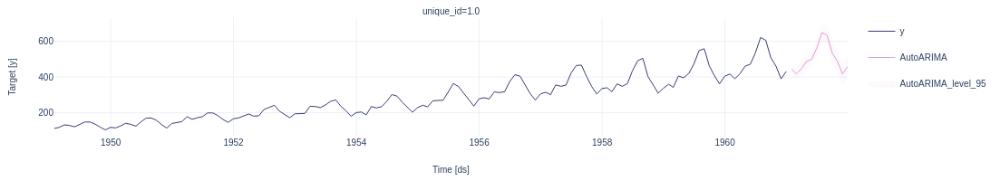

In [28]:
sf.plot(df,forecast_df,level=[95],engine="plotly")

## End to end

In [33]:
import pandas as pd
df = pd.read_parquet('https://datasets-nixtla.s3.amazonaws.com/m4-hourly.parquet')
df.head()

,unique_id,ds,y
0,H1,1,605.0
1,H1,2,586.0
2,H1,3,586.0
3,H1,4,559.0
4,H1,5,511.0


In [37]:
len(df.unique_id.unique()) # Total number of unique series 

414

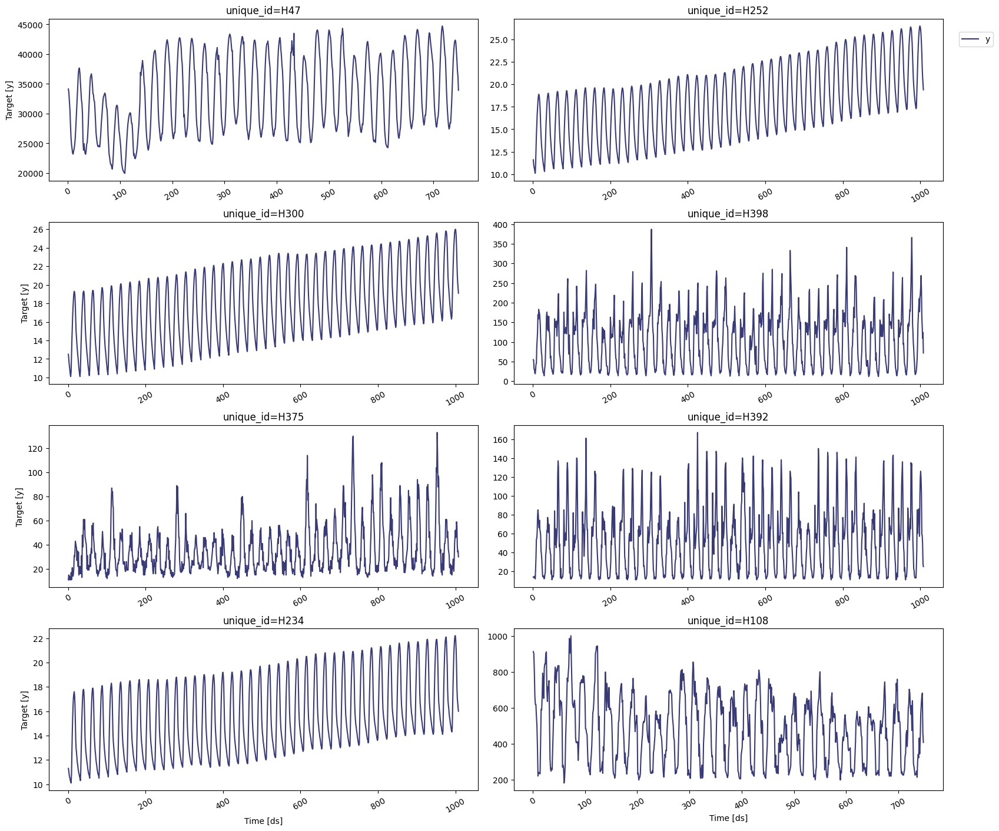

In [40]:
StatsForecast.plot(df)

Auto Forecast: Automatic forecasting tools search for the best parameters and select the best possible model for a series of time series. These tools are useful for large collections of univariate time series. Includes automatic versions of: Arima, ETS, Theta, CES.

Exponential Smoothing: Uses a weighted average of all past observations where the weights decrease exponentially into the past. Suitable for data with no clear trend or seasonality. Examples: SES, Holt’s Winters, SSO.

Benchmark models: classical models for establishing baselines. Examples: Mean, Naive, Random Walk

Intermittent or Sparse models: suited for series with very few non-zero observations. Examples: CROSTON, ADIDA, IMAPA

Multiple Seasonalities: suited for signals with more than one clear seasonality. Useful for low-frequency data like electricity and logs. Examples: MSTL.

Theta Models: fit two theta lines to a deseasonalized time series, using different techniques to obtain and combine the two theta lines to produce the final forecasts. Examples: Theta, DynamicTheta



In [42]:
from statsforecast.models import (
    HoltWinters,
    CrostonClassic as Croston, 
    HistoricAverage,
    DynamicOptimizedTheta as DOT,
    SeasonalNaive
)

# Create a list of models and instantiation parameters
models = [
    HoltWinters(),
    Croston(),
    SeasonalNaive(season_length=24),
    HistoricAverage(),
    DOT(season_length=24)
]

In [43]:
# Instantiate StatsForecast class as sf
sf = StatsForecast( 
    models=models,
    freq=1, 
    fallback_model = SeasonalNaive(season_length=7),
    n_jobs=-1,
)

The forecast method is compatible with distributed clusters, so it does not store any model parameters. If you want to store parameters for every model you can use the fit and predict methods. However, those methods are not defined for distrubed engines like Spark, Ray or Dask

In [47]:
%%time
sf.fit(df)
future_forecast = sf.predict(h=48)

CPU times: user 196 ms, sys: 608 ms, total: 803 ms
Wall time: 35.3 s


In [49]:
%%time
future_forecast = sf.forecast(df=Y_df, h=48)
future_forecast.head()

CPU times: user 243 ms, sys: 322 ms, total: 565 ms
Wall time: 26.4 s


,unique_id,ds,HoltWinters,CrostonClassic,SeasonalNaive,HistoricAverage,DynamicOptimizedTheta
0,H1,749,829.0,708.214026,635.0,639.820856,597.484838
1,H1,750,807.0,708.214026,572.0,639.820856,535.542445
2,H1,751,785.0,708.214026,532.0,639.820856,492.819783
3,H1,752,756.0,708.214026,493.0,639.820856,461.005823
4,H1,753,719.0,708.214026,477.0,639.820856,440.918265


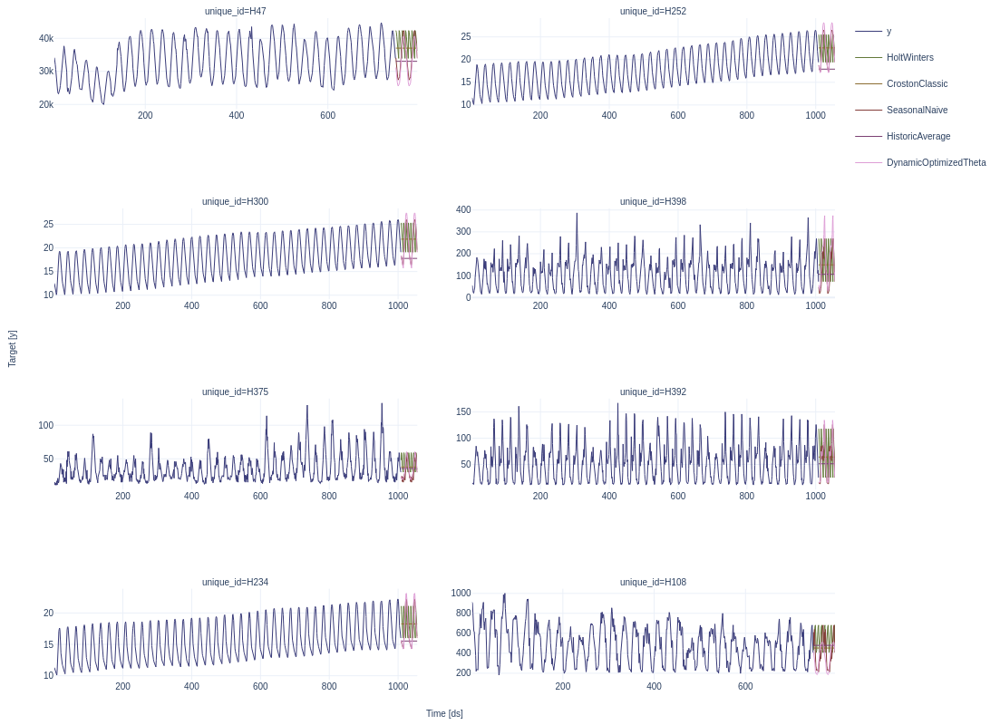

In [52]:
sf.plot(df,future_forecast,engine='plotly')

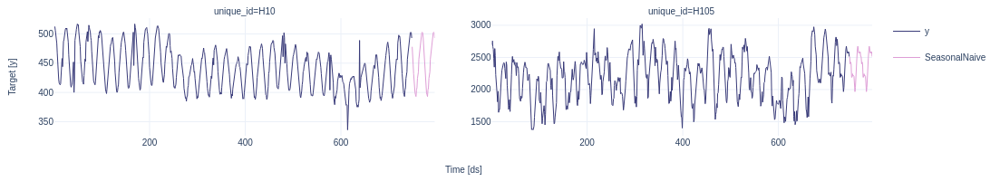

In [57]:
# Plot to unique_ids and some selected models
sf.plot(df, future_forecast, models=["SeasonalNaive"], unique_ids=["H10", "H105"],engine='plotly')

### Evaluate the model’s performance

In [58]:
# Cross Validation
cv_df = sf.cross_validation(
    df=df,
    h=24,
    step_size=24,
    n_windows=2
)

In [70]:
from utilsforecast.losses import mse
def evaluate_cv(df, metric):
    models = df.columns.drop(['unique_id', 'ds', 'y', 'cutoff']).tolist()
    evals = metric(df, models=models)
    evals['best_model'] = evals[models].idxmin(axis=1)
    return evals

evaluation_df = evaluate_cv(cv_df, mse)
evaluation_df.head()

,unique_id,HoltWinters,CrostonClassic,SeasonalNaive,HistoricAverage,DynamicOptimizedTheta,best_model
0,H1,44888.020833,28038.758825,1422.666667,21317.848309,938.578473,DynamicOptimizedTheta
1,H10,2812.916667,1483.483683,96.895833,1387.035567,145.758321,SeasonalNaive
2,H100,121625.375000,91945.293654,12019.000000,78496.693670,48482.175667,SeasonalNaive
3,H101,28453.395833,16183.631871,10944.458333,30003.876007,36071.407444,SeasonalNaive
4,H102,232924.854167,132655.241387,12699.895833,289089.384267,28613.315599,SeasonalNaive


In [71]:
evaluation_df['best_model'].value_counts().to_frame().reset_index()

,best_model,count
0,SeasonalNaive,260
1,DynamicOptimizedTheta,138
2,HistoricAverage,8
3,CrostonClassic,7
4,HoltWinters,1


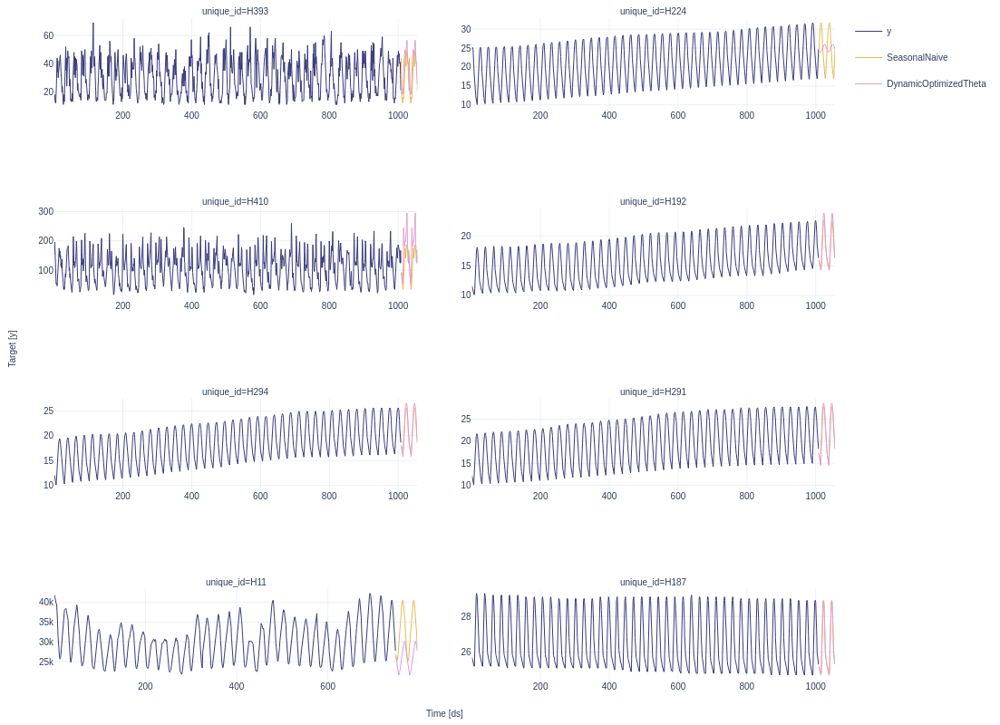

In [75]:
seasonal_ids = evaluation_df.query('best_model == "SeasonalNaive"')['unique_id']
sf.plot(df,future_forecast, unique_ids=seasonal_ids, models=["SeasonalNaive","DynamicOptimizedTheta"],engine='plotly')

In [84]:
# # Select the best model for every unique series
# def get_best_model_forecast(forecasts_df, evaluation_df):
#     with_best = forecasts_df.merge(evaluation_df[['unique_id', 'best_model']])
#     res = with_best[['unique_id', 'ds']].copy()
#     for suffix in ('', '-lo-90', '-hi-90'):
#         res[f'best_model{suffix}'] = with_best.apply(lambda row: row[row['best_model'] + suffix], axis=1)
#     return res

# prod_forecasts_df = get_best_model_forecast(future_forecast, evaluation_df)
# prod_forecasts_df.head()

In [83]:
# sf.plot(df, prod_forecasts_df)

### Anomaly Detection

In [85]:
from utilsforecast.plotting import plot_series

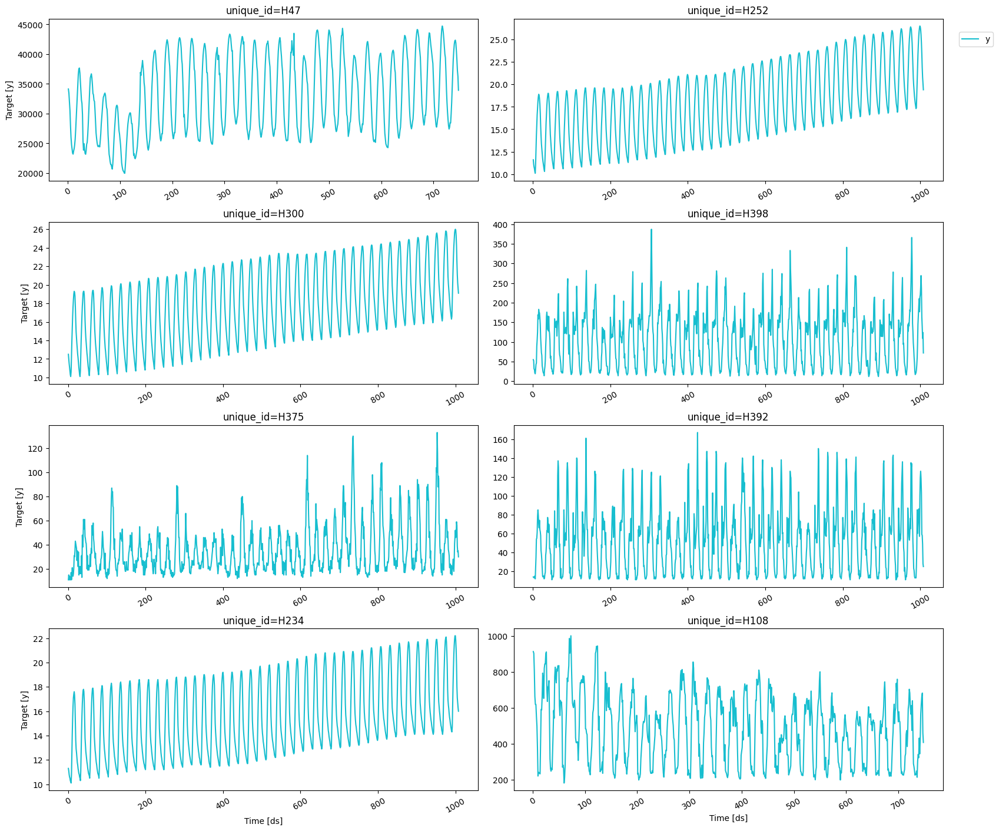

In [86]:
plot_series(df)

In [87]:
from statsforecast.models import MSTL
# Create a list of models and instantiation parameters 
models = [MSTL(season_length = [24, 24*7])]

In [88]:
sf = StatsForecast(
    models=models, 
    freq=1,
    n_jobs=-1,
)

In [89]:
horizon = 48
levels = [99] 

fcst = sf.forecast(df=df, h=48, level=levels, fitted=True)
fcst.head()

,unique_id,ds,MSTL,MSTL-lo-99,MSTL-hi-99
0,H1,749,607.607223,587.173250,628.041196
1,H1,750,552.364253,521.069710,583.658796
2,H1,751,506.785334,465.894977,547.675691
3,H1,752,472.906141,423.114088,522.698195
4,H1,753,452.240231,394.064394,510.416067


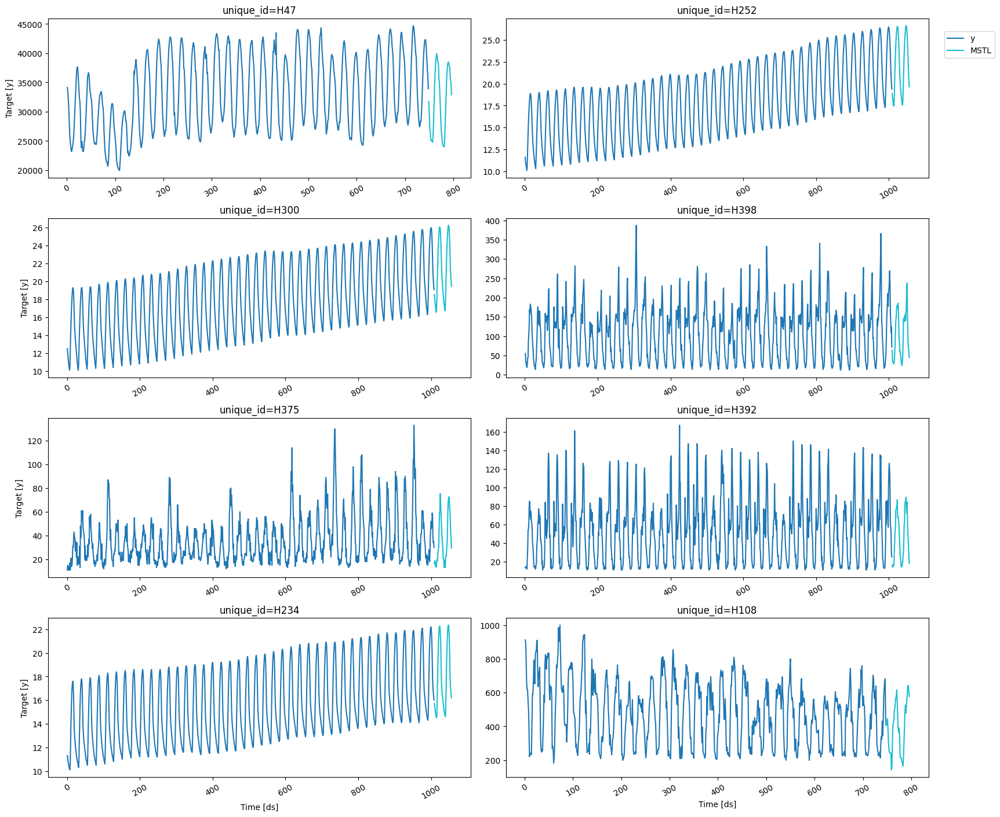

In [90]:
plot_series(df, fcst)

In [91]:
insample_forecasts = sf.forecast_fitted_values()
insample_forecasts.head()

,unique_id,ds,y,MSTL,MSTL-lo-99,MSTL-hi-99
0,H1,1,605.0,605.098607,584.678408,625.518805
1,H1,2,586.0,588.496673,568.076474,608.916872
2,H1,3,586.0,585.586856,565.166657,606.007054
3,H1,4,559.0,554.012377,533.592178,574.432576
4,H1,5,511.0,510.153508,489.733309,530.573707


In [92]:
anomalies = insample_forecasts[insample_forecasts['y'].between(insample_forecasts['MSTL-lo-99'], insample_forecasts['MSTL-hi-99'])]
anomalies.head()

,unique_id,ds,y,MSTL,MSTL-lo-99,MSTL-hi-99
0,H1,1,605.0,605.098607,584.678408,625.518805
1,H1,2,586.0,588.496673,568.076474,608.916872
2,H1,3,586.0,585.586856,565.166657,606.007054
3,H1,4,559.0,554.012377,533.592178,574.432576
4,H1,5,511.0,510.153508,489.733309,530.573707


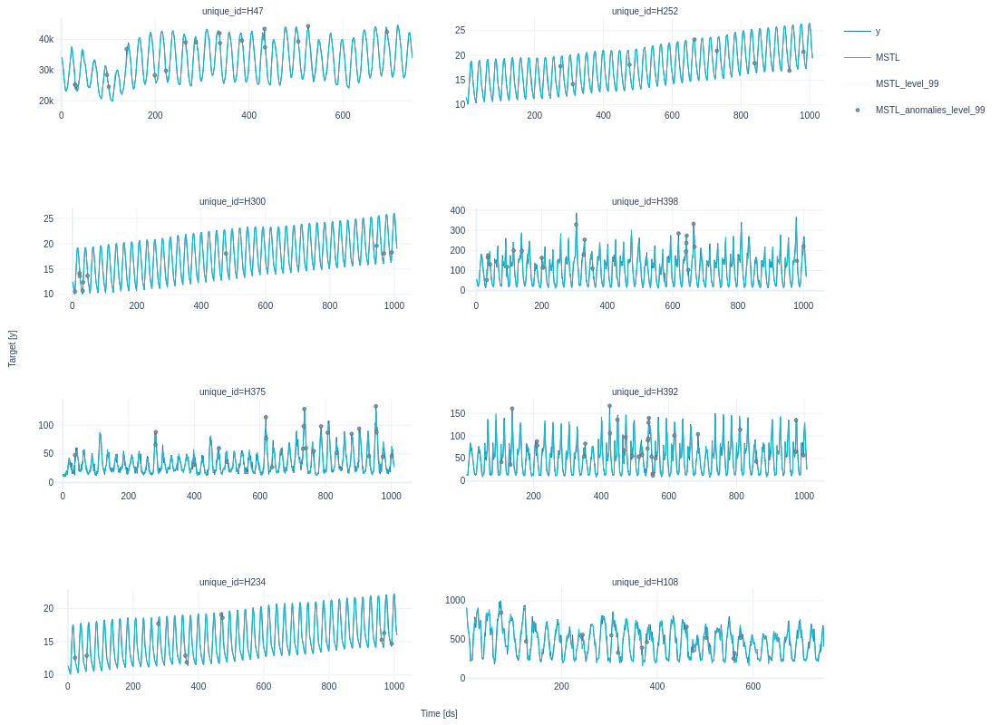

In [94]:
plot_series(forecasts_df=insample_forecasts, level=levels, plot_anomalies=True,engine='plotly')

### Multiple seasonalities

In [95]:
## Tip : For this task, StatsForecast’s MSTL is 68% more accurate and 600% faster than Prophet and NeuralProphet. (Reproduce experiments here)


In [102]:
df = pd.read_csv('https://raw.githubusercontent.com/panambY/Hourly_Energy_Consumption/master/data/PJM_Load_hourly.csv')
df.columns = ['ds', 'y']
df.insert(0, 'unique_id', 'PJM_Load_hourly')
df = df.sort_values(['unique_id', 'ds']).reset_index(drop=True) # StatsForecast can handle unsorted data, however, for plotting purposes, it is convenient to sort the data frame.

df.tail()

,unique_id,ds,y
32891,PJM_Load_hourly,2001-12-31 20:00:00,36392.0
32892,PJM_Load_hourly,2001-12-31 21:00:00,35082.0
32893,PJM_Load_hourly,2001-12-31 22:00:00,33890.0
32894,PJM_Load_hourly,2001-12-31 23:00:00,32590.0
32895,PJM_Load_hourly,2002-01-01 00:00:00,31569.0


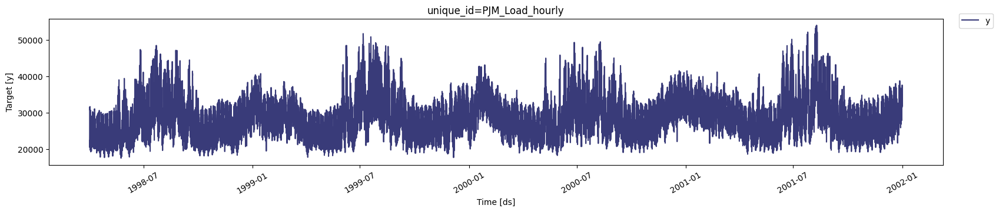

In [103]:
from statsforecast import StatsForecast
StatsForecast.plot(df)

The MSTL (Multiple Seasonal-Trend decompositions using LOESS) model, originally developed by Kasun Bandara, Rob J Hyndman and Christoph Bergmeir, decomposes the time series in multiple seasonalities using a Local Polynomial Regression (LOESS). Then it forecasts the trend using a non-seasonal model and each seasonality using a SeasonalNaive model.

In [106]:
from statsforecast.models import MSTL, AutoARIMA
# Create a list of models and instantiation parameters

models = [MSTL(
    season_length=[24, 24 * 7], # seasonalities of the time series 
    trend_forecaster=AutoARIMA() # model used to forecast trend
)]
sf = StatsForecast(
    models=models, # model used to fit each time series 
    freq='h', # frequency of the data
)
sf.fit(df)

StatsForecast(models=[MSTL])

#### Decompose the series

In [107]:
sf.fitted_[0, 0].model_

,data,trend,seasonal24,seasonal168,remainder
0,22259.0,25899.808157,-4720.213546,581.308595,498.096794
1,21244.0,25900.349395,-5433.168901,571.780657,205.038849
2,20651.0,25900.875973,-5829.135728,557.142643,22.117112
3,20421.0,25901.387631,-5704.092794,597.696957,-373.991794
4,20713.0,25901.884103,-5023.324375,922.564854,-1088.124582
...,...,...,...,...,...
32891,36392.0,33329.031577,4254.112720,917.258336,-2108.402633
32892,35082.0,33355.083576,3625.077164,721.689136,-2619.849876
32893,33890.0,33381.108409,2571.794472,549.661529,-2612.564409
32894,32590.0,33407.105839,796.356548,361.956280,-1975.418667


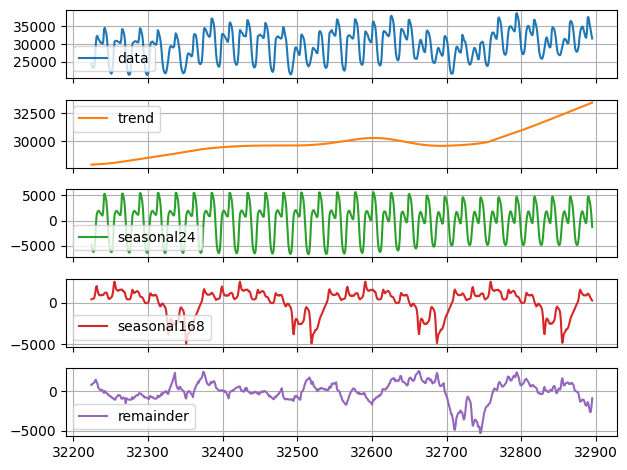

In [112]:
import matplotlib.pyplot as plt
sf.fitted_[0, 0].model_.tail(24 * 28).plot(subplots=True, grid=True)
plt.tight_layout()
plt.show()

In [113]:
forecasts = sf.predict(h=24, level=[90])
forecasts.head()

,unique_id,ds,MSTL,MSTL-lo-90,MSTL-hi-90
0,PJM_Load_hourly,2002-01-01 01:00:00,30215.608163,29842.185622,30589.030705
1,PJM_Load_hourly,2002-01-01 02:00:00,29447.209028,28787.123369,30107.294687
2,PJM_Load_hourly,2002-01-01 03:00:00,29132.787603,28221.354454,30044.220751
3,PJM_Load_hourly,2002-01-01 04:00:00,29126.254591,27992.821420,30259.687762
4,PJM_Load_hourly,2002-01-01 05:00:00,29604.608674,28273.428663,30935.788686


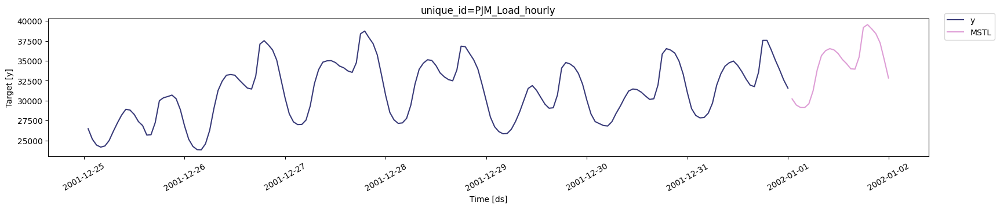

In [114]:
sf.plot(df, forecasts, max_insample_length=24 * 7)

In [115]:
#### Forecast in production
forecasts_df = sf.forecast(df=df, h=24, level=[90])
forecasts_df.head()

,unique_id,ds,MSTL,MSTL-lo-90,MSTL-hi-90
0,PJM_Load_hourly,2002-01-01 01:00:00,30215.608163,29842.185622,30589.030705
1,PJM_Load_hourly,2002-01-01 02:00:00,29447.209028,28787.123369,30107.294687
2,PJM_Load_hourly,2002-01-01 03:00:00,29132.787603,28221.354454,30044.220751
3,PJM_Load_hourly,2002-01-01 04:00:00,29126.254591,27992.821420,30259.687762
4,PJM_Load_hourly,2002-01-01 05:00:00,29604.608674,28273.428663,30935.788686


## Intermittent or Sparse Data

Intermittent or sparse data has very few non-zero observations. This type of data is hard to forecast because the zero values increase the uncertainty about the underlying patterns in the data.

In [118]:
import pandas as pd
uids = [
    'FOODS_1_001_CA_1',
    'FOODS_1_001_CA_2',
    'FOODS_1_001_CA_3',
    'FOODS_1_001_CA_4',
    'FOODS_1_001_TX_1',
    'FOODS_1_001_TX_2',
    'FOODS_1_001_TX_3',
    'FOODS_1_001_WI_1',
]
df = pd.read_parquet(
    'https://datasets-nixtla.s3.amazonaws.com/m5_y.parquet',
    filters=[('unique_id', 'in', uids)],
)

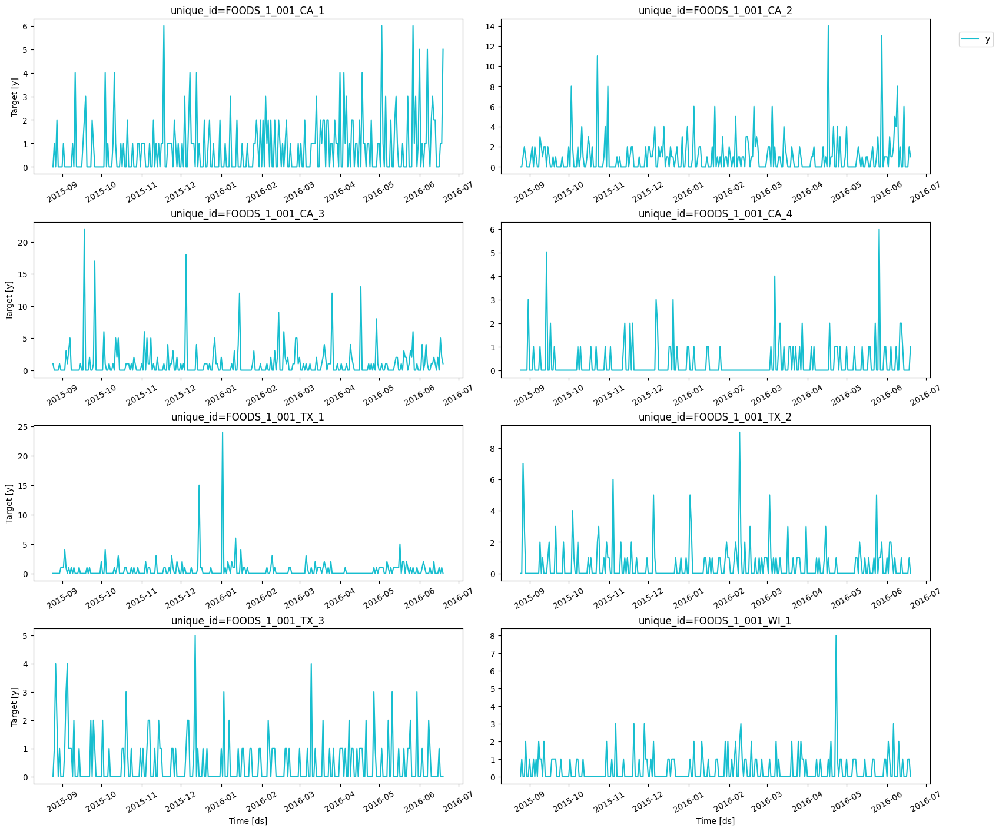

In [121]:
from utilsforecast.plotting import plot_series
plot_series(df, plot_random=False, max_insample_length=300)

In [124]:
df.groupby('unique_id', observed=True)['y'].median()

unique_id
FOODS_1_001_CA_1    0.0
FOODS_1_001_CA_2    1.0
FOODS_1_001_CA_3    0.0
FOODS_1_001_CA_4    0.0
FOODS_1_001_TX_1    0.0
FOODS_1_001_TX_2    0.0
FOODS_1_001_TX_3    0.0
FOODS_1_001_WI_1    0.0
Name: y, dtype: float32

In [125]:
valid_start = df['ds'].unique()[-28]

train = df[df['ds'] < valid_start]
test = df[df['ds'] >= valid_start]

In [126]:
from statsforecast import StatsForecast
from statsforecast.models import (
    ADIDA,
    CrostonClassic, 
    IMAPA, 
    TSB
)

# Create a list of models and instantiation parameters 
models = [
    ADIDA(), 
    CrostonClassic(), 
    IMAPA(), 
    TSB(alpha_d = 0.2, alpha_p = 0.2)
]

In [127]:
sf = StatsForecast(
    models=models, 
    freq='D', 
    n_jobs=-1,
)

In [128]:
horizon = 28 
forecasts = sf.forecast(df=train, h=horizon)
forecasts.head()

,unique_id,ds,ADIDA,CrostonClassic,IMAPA,TSB
0,FOODS_1_001_CA_1,2016-05-23,0.791852,0.898247,0.705835,0.434313
1,FOODS_1_001_CA_1,2016-05-24,0.791852,0.898247,0.705835,0.434313
2,FOODS_1_001_CA_1,2016-05-25,0.791852,0.898247,0.705835,0.434313
3,FOODS_1_001_CA_1,2016-05-26,0.791852,0.898247,0.705835,0.434313
4,FOODS_1_001_CA_1,2016-05-27,0.791852,0.898247,0.705835,0.434313


In [129]:
test = test.merge(forecasts, how='left', on=['unique_id', 'ds'])

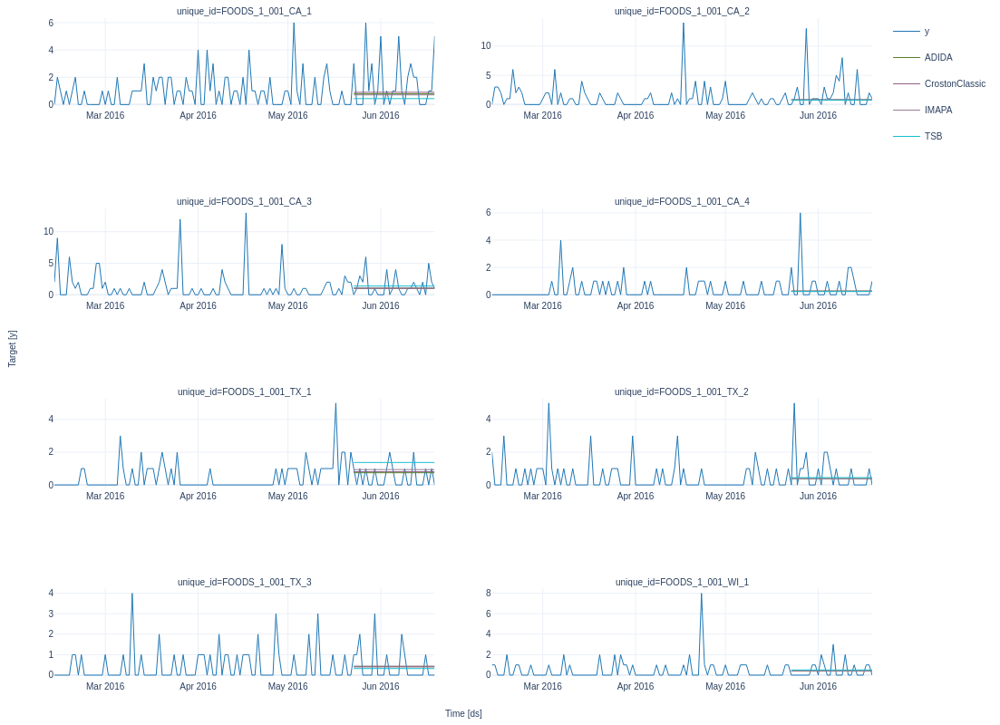

In [132]:
plot_series(train, test, plot_random=False, max_insample_length=100,engine='plotly')

In [131]:
from utilsforecast.evaluation import evaluate
from utilsforecast.losses import mae
evaluate(test, metrics=[mae], agg_fn='mean')

,metric,ADIDA,CrostonClassic,IMAPA,TSB
0,mae,0.948729,0.944071,0.957256,1.023126
